# Generating residual visibilities and images 

This example is similar to 2458115.31139, showing how to generate residual visibilites, but for a different dataset bearing julian date 2458115.31939.

In [2]:
%matplotlib notebook
from beam_solver import imaging as imag
from beam_solver import uv_convert as uc
from beam_solver import generate_resvis as gv
from beam_solver import get_redbls as gb
import uvtools
import pylab
import os
import pyuvdata
import numpy as np
from collections import OrderedDict
import hera_cal as hc

In [3]:
DATA_PATH = '/Users/Ridhima/Documents/ucb_projects/beam_characterization/hera_data'

In [4]:
uvfile = os.path.join(DATA_PATH, 'zen.2458115.31939.xx.HH.uvOCR')
modelfile = os.path.join(DATA_PATH, 'zen.2458115.31939.xx.HH.uv.vis.uvfits')
omnifile = os.path.join(DATA_PATH, 'zen.2458115.31939.xx.HH.uv.omni.calfits')
absfile = os.path.join(DATA_PATH, 'zen.2458115.31939.xx.HH.uv.abs.calfits')
resfile = os.path.join(DATA_PATH, 'zen.2458115.31939.xx.HH.uvOCR.res')

## Loading dataset

In [5]:
uvd = pyuvdata.UVData()
uvd.read_miriad(uvfile)

In [5]:
# forming dictionary contianing redundant baseline groups
def generate_antdict(uvd):
        """
        Generates dictionary with antenna numbers as the keys and antenna positions
        as the corresponding items.
        NOTE : input to hera_cal.redcal.get_reds function

        Parameters
        ----------
        uvd : UVData object
            UVData object containing interferometric visibilities and the required
            metadata.
        """
        antpos = uvd.antenna_positions
        antnums = uvd.antenna_numbers
        pos_dict = OrderedDict()
        for ii, an in enumerate(antnums):
            pos_dict[an] = antpos[ii, :]
        return pos_dict

In [6]:
pos_dict = generate_antdict(uvd)
red_bls = hc.redcal.get_reds(pos_dict)
red = gb.RBL(red_bls)

In [7]:
bl = (11, 12)
key = (11, 12, 'xx')
bl_grp = red[key]
print bl_grp

[(0, 1, 'xx'), (1, 2, 'xx'), (11, 12, 'xx'), (12, 13, 'xx'), (13, 14, 'xx'), (23, 24, 'xx'), (24, 25, 'xx'), (25, 26, 'xx'), (26, 27, 'xx'), (36, 37, 'xx'), (37, 38, 'xx'), (38, 39, 'xx'), (39, 40, 'xx'), (40, 41, 'xx'), (50, 51, 'xx'), (51, 52, 'xx'), (52, 53, 'xx'), (53, 54, 'xx'), (54, 55, 'xx'), (65, 66, 'xx'), (66, 67, 'xx'), (67, 68, 'xx'), (68, 69, 'xx'), (69, 70, 'xx'), (70, 71, 'xx'), (82, 83, 'xx'), (83, 84, 'xx'), (84, 85, 'xx'), (85, 86, 'xx'), (86, 87, 'xx'), (87, 88, 'xx'), (120, 121, 'xx'), (121, 122, 'xx'), (122, 123, 'xx'), (123, 124, 'xx'), (136, 137, 'xx'), (137, 138, 'xx'), (138, 139, 'xx'), (139, 140, 'xx'), (140, 141, 'xx'), (141, 142, 'xx'), (142, 143, 'xx')]


In [8]:
lst = uvd.lst_array
nbls = len(bl_grp)
print 'Number of redundant baselines: {}'.format(nbls)

Number of redundant baselines: 42


<IPython.core.display.Javascript object>


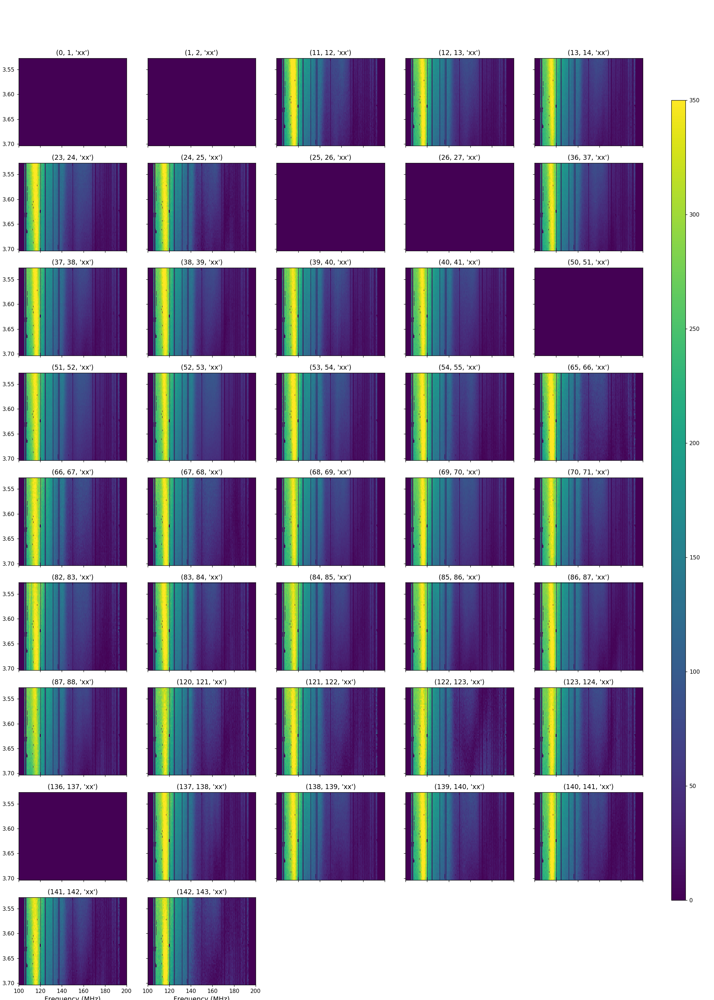

In [9]:
Nside = 5
Yside = int(np.ceil(float(nbls)/Nside))
fig, axes = pylab.subplots(Yside, Nside, figsize=(18, 14*float(Yside)/Nside), dpi=75)
fig.suptitle("", fontsize=14)
fig.tight_layout(rect=(0, 0, 1, 0.95))
k = 0
freqs = np.linspace(100,200,1024)
lst_hrs = lst * 12/np.pi
for i in range(Yside):
    for j in range(Nside):
        ax = axes[i,j]
        if  k < nbls:
            blp =  bl_grp[k]
            ax.set_title(bl)
            pylab.sca(ax)
            im = uvtools.plot.waterfall(uvd.get_data(blp)* ~uvd.get_flags(blp), mode='lin', mx=350,drng=350,  extent=(100,200, lst_hrs[-1],lst_hrs[0]),)
            ax.xaxis.set_ticks_position('bottom')
            ax.set_title(blp)
        else:
            ax.axis('off')

        if j != 0:
            ax.set_yticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_yticklabels()]
            ax.set_ylabel('LST (hrs)', fontsize=12)
        if i != Yside-1:
            ax.set_xticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_xticklabels()]
            ax.set_xlabel('Frequency (MHz)', fontsize=12)
        k += 1 
        
fig.subplots_adjust(right=0.90)
cax = fig.add_axes([0.94, 0.10, 0.02, 0.8])
cb = fig.colorbar(im, cax=cax)

<IPython.core.display.Javascript object>


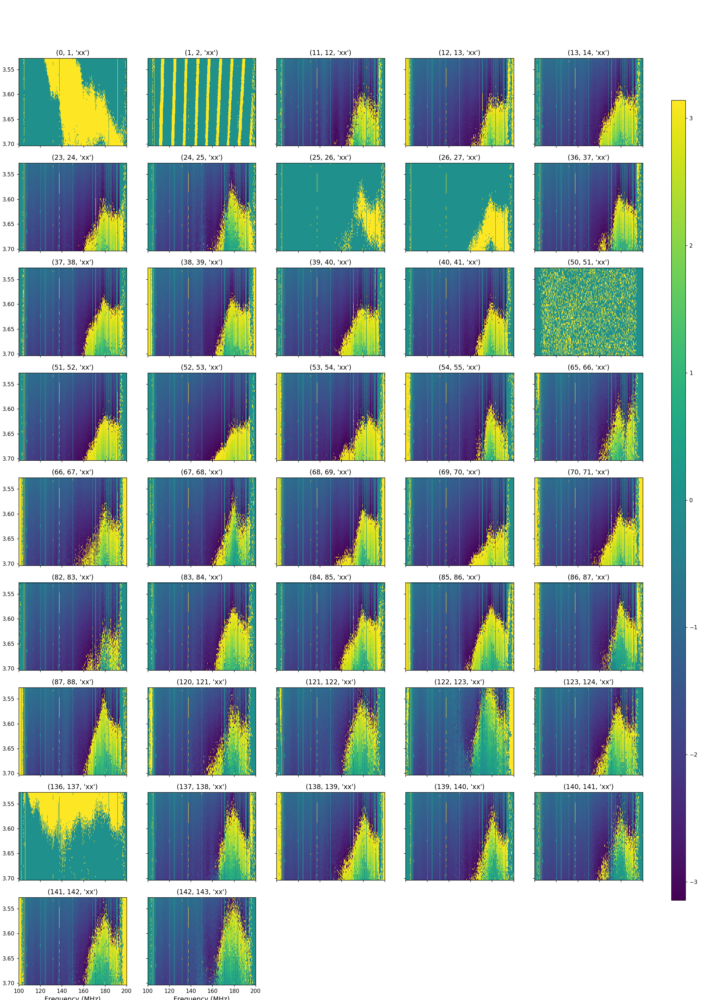

In [10]:
Nside = 5
Yside = int(np.ceil(float(nbls)/Nside))
fig, axes = pylab.subplots(Yside, Nside, figsize=(18, 14*float(Yside)/Nside), dpi=75)
fig.suptitle("", fontsize=14)
fig.tight_layout(rect=(0, 0, 1, 0.95))
k = 0
freqs = np.linspace(100,200,1024)
lst_hrs = lst * 12/np.pi
for i in range(Yside):
    for j in range(Nside):
        ax = axes[i,j]
        if  k < nbls:
            blp =  bl_grp[k]
            ax.set_title(bl)
            plot_data = np.angle(uvd.get_data(blp))
            pylab.sca(ax)
            im = uvtools.plot.waterfall(uvd.get_data(blp)* ~uvd.get_flags(blp), mode='phs', mx=np.pi,drng=2*np.pi,  extent=(100,200, lst_hrs[-1],lst_hrs[0]),)
            ax.xaxis.set_ticks_position('bottom')
            ax.set_title(blp)
        else:
            ax.axis('off')

        if j != 0:
            ax.set_yticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_yticklabels()]
            ax.set_ylabel('LST (hrs)', fontsize=12)
        if i != Yside-1:
            ax.set_xticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_xticklabels()]
            ax.set_xlabel('Frequency (MHz)', fontsize=12)
        k += 1 
        
fig.subplots_adjust(right=0.90)
cax = fig.add_axes([0.94, 0.10, 0.02, 0.8])
cb = fig.colorbar(im, cax=cax)

## Loading model visibilities and calibration solutions

In [11]:
uvm = pyuvdata.UVData()
uvm.read_uvfits(modelfile)
uvm.unphase_to_drift()

<IPython.core.display.Javascript object>


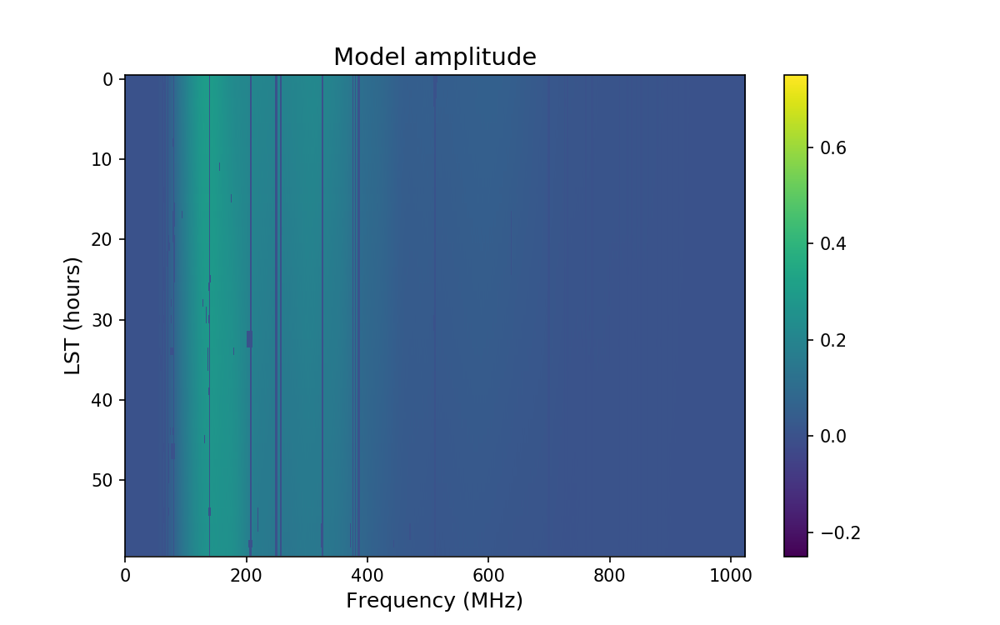

In [12]:
fig = pylab.figure(figsize=(8,5))
freqs = np.linspace(100,200,1024)
ax = pylab.subplot(111)
im = uvtools.plot.waterfall(uvm.get_data(bl) * ~uvd.get_flags(bl), mode='lin', mx=0.75,drng=1) # extent=(100,200, lst_hrs[-1],lst_hrs[0]),)
ax.xaxis.set_ticks_position('bottom')
pylab.colorbar(im)
pylab.title("Model amplitude", fontsize=14)
pylab.ylabel('LST (hours)',fontsize=12)
pylab.xlabel('Frequency (MHz)',fontsize=12)
pylab.tick_params(labelsize=10)

In [13]:
omnigains, omniflags = hc.io.load_cal(omnifile)
absgains, absflags = hc.io.load_cal(absfile)

In [14]:
# absolute calibration the model visibilities
bl = (11, 12)
data_m = uvm.get_data(bl).copy()
data_m *= omnigains[bl[0],'Jxx'] * np.conj(omnigains[bl[1],'Jxx'])
data_m /=  absgains[bl[0],'Jxx']  *  np.conj(absgains[bl[1],'Jxx'])    

<IPython.core.display.Javascript object>


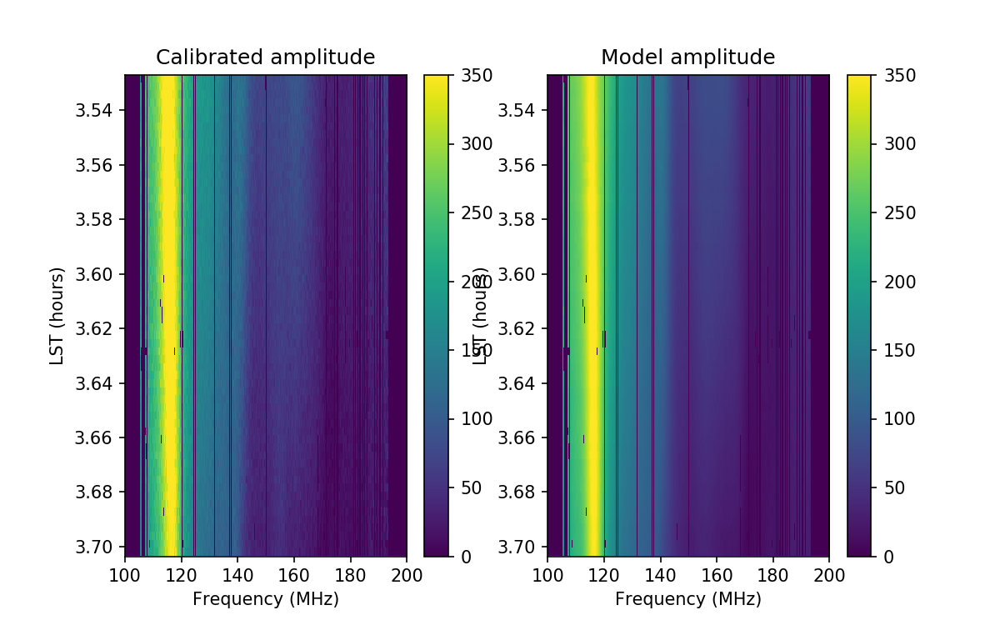

In [15]:
data_11_12 = uvd.get_data(bl) * ~uvd.get_flags(bl)
moddata_11_12 = data_m * ~uvd.get_flags(bl)

fig = pylab.figure(figsize=(8,5))
freqs = np.linspace(100,200,1024)
ax1 = pylab.subplot(121)
im = uvtools.plot.waterfall(data_11_12, mode='lin', mx=350 ,drng=350, extent=(100,200, lst_hrs[-1],lst_hrs[0]),)
ax1.xaxis.set_ticks_position('bottom')
pylab.colorbar(im)
pylab.title("Calibrated amplitude", fontsize=12)
pylab.ylabel('LST (hours)',fontsize=10)
pylab.xlabel('Frequency (MHz)',fontsize=10)
pylab.tick_params(labelsize=10)

ax2 = pylab.subplot(122)
im = uvtools.plot.waterfall(moddata_11_12, mode='lin', mx=350 ,drng=350, extent=(100,200, lst_hrs[-1],lst_hrs[0]),)
ax2.xaxis.set_ticks_position('bottom')
pylab.colorbar(im)
pylab.title("Model amplitude", fontsize=12)
pylab.ylabel('LST (hours)',fontsize=10)
pylab.xlabel('Frequency (MHz)',fontsize=10)
pylab.tick_params(labelsize=10)

<IPython.core.display.Javascript object>


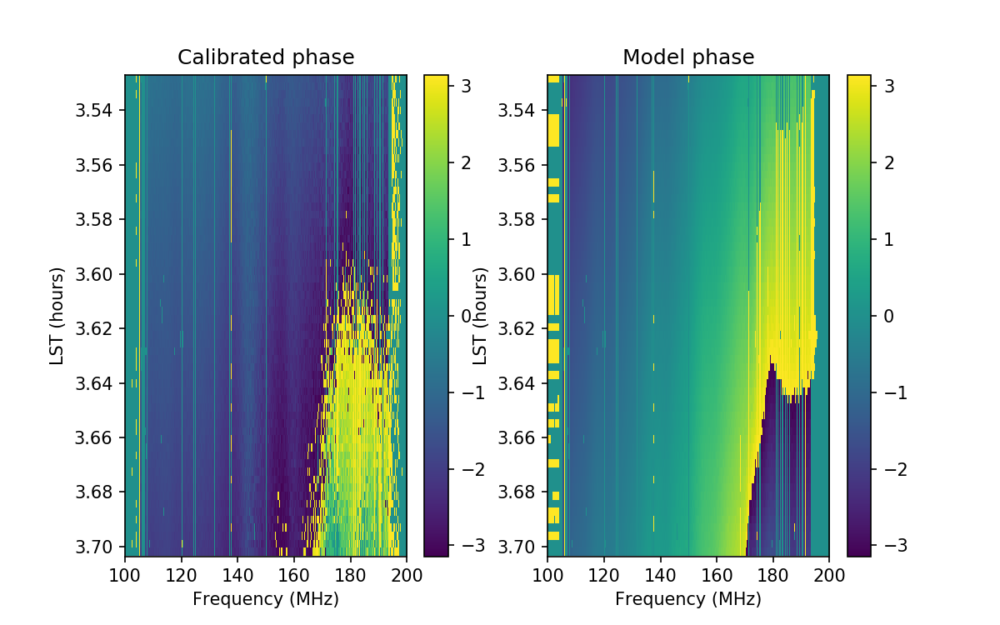

In [16]:
fig = pylab.figure(figsize=(8,5))
freqs = np.linspace(100,200,1024)
ax1 = pylab.subplot(121)
im = uvtools.plot.waterfall(data_11_12, mode='phs', mx=np.pi ,drng=2*np.pi, extent=(100,200, lst_hrs[-1],lst_hrs[0]),)
ax1.xaxis.set_ticks_position('bottom')
pylab.colorbar(im)
pylab.title("Calibrated phase", fontsize=12)
pylab.ylabel('LST (hours)',fontsize=10)
pylab.xlabel('Frequency (MHz)',fontsize=10)
pylab.tick_params(labelsize=10)

ax2 = pylab.subplot(122)
im = uvtools.plot.waterfall(moddata_11_12, mode='phs', mx=np.pi ,drng=2*np.pi, extent=(100,200, lst_hrs[-1],lst_hrs[0]),)
ax2.xaxis.set_ticks_position('bottom')
pylab.colorbar(im)
pylab.title("Model phase", fontsize=12)
pylab.ylabel('LST (hours)',fontsize=10)
pylab.xlabel('Frequency (MHz)',fontsize=10)
pylab.tick_params(labelsize=10)

The model visibilities seem to be somehow conjugated.

In [17]:
data_m = np.conj(uvm.get_data(bl).copy())
data_m *= omnigains[bl[0],'Jxx'] * np.conj(omnigains[bl[1],'Jxx'])
data_m /=  absgains[bl[0],'Jxx']  *  np.conj(absgains[bl[1],'Jxx'])    

<IPython.core.display.Javascript object>


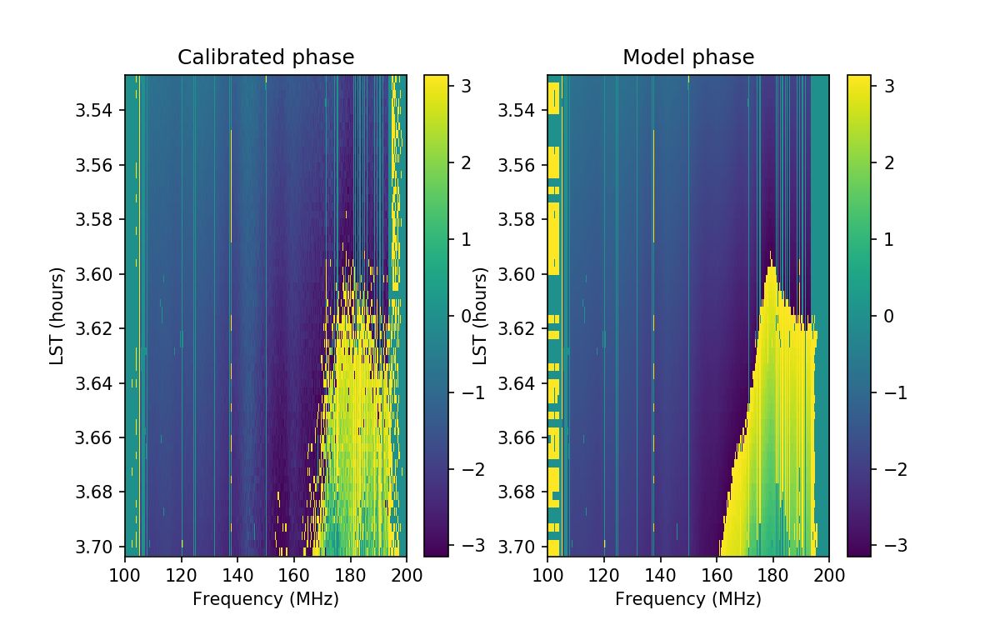

In [18]:
moddata_11_12 = data_m * ~uvd.get_flags(bl)

fig = pylab.figure(figsize=(8,5))
freqs = np.linspace(100,200,1024)
ax1 = pylab.subplot(121)
im = uvtools.plot.waterfall(data_11_12, mode='phs', mx=np.pi ,drng=2*np.pi, extent=(100,200, lst_hrs[-1],lst_hrs[0]),)
ax1.xaxis.set_ticks_position('bottom')
pylab.colorbar(im)
pylab.title("Calibrated phase", fontsize=12)
pylab.ylabel('LST (hours)',fontsize=10)
pylab.xlabel('Frequency (MHz)',fontsize=10)
pylab.tick_params(labelsize=10)

ax2 = pylab.subplot(122)
im = uvtools.plot.waterfall(moddata_11_12, mode='phs', mx=np.pi ,drng=2*np.pi, extent=(100,200, lst_hrs[-1],lst_hrs[0]),)
ax2.xaxis.set_ticks_position('bottom')
pylab.colorbar(im)
pylab.title("Model phase", fontsize=12)
pylab.ylabel('LST (hours)',fontsize=10)
pylab.xlabel('Frequency (MHz)',fontsize=10)
pylab.tick_params(labelsize=10)

<IPython.core.display.Javascript object>


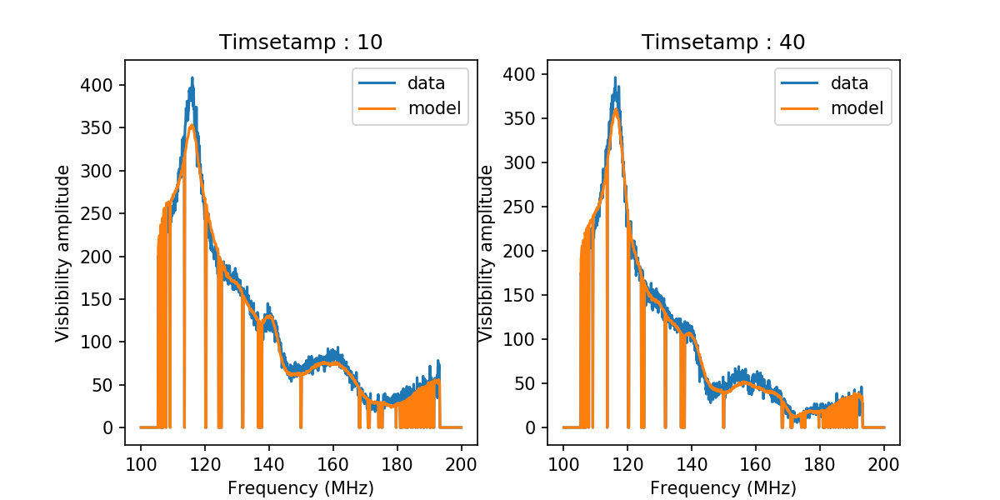

Text(0.5,1,'Timsetamp : 40')

In [19]:
fig = pylab.figure(figsize=(8,4))
pylab.subplot(121)
pylab.plot(freqs, np.abs(data_11_12[10, :]), label='data')
pylab.plot(freqs, np.abs(moddata_11_12[10, :]), label='model')
pylab.legend()
pylab.xlabel('Frequency (MHz)',fontsize=10)
pylab.ylabel('Visbibility amplitude', fontsize=10)
pylab.title('Timsetamp : 10', size=12)

pylab.subplot(122)
pylab.plot(freqs, np.abs(data_11_12[40, :]), label='data')
pylab.plot(freqs, np.abs(moddata_11_12[40, :]), label='model')
pylab.legend()
pylab.xlabel('Frequency (MHz)',fontsize=10)
pylab.ylabel('Visbibility amplitude', fontsize=10)
pylab.title('Timsetamp : 40', size=12)

## Generating residual visibilities 

In [6]:
rv = gv.Resvis(uvfile)
rv.generate_residual(modelfile, omnifile, absfile, 'xx', clobber=True, outfile=resfile)

File exists: clobbering


In [21]:
uvr = pyuvdata.UVData()
uvr.read_miriad(resfile)

<IPython.core.display.Javascript object>


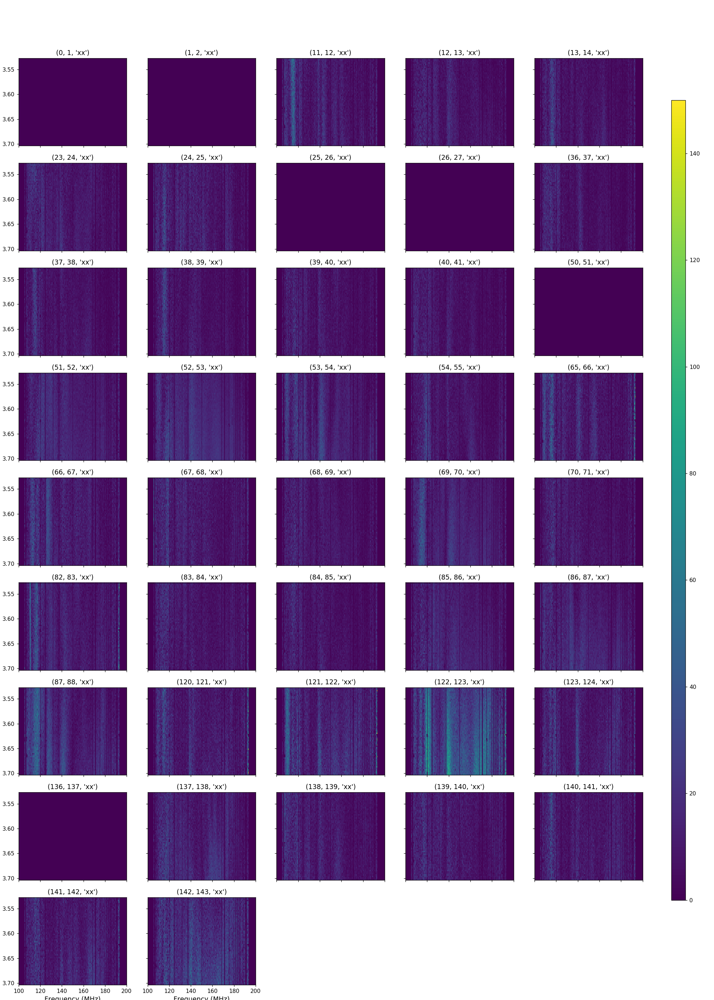

In [22]:
Nside = 5
Yside = int(np.ceil(float(nbls)/Nside))
fig, axes = pylab.subplots(Yside, Nside, figsize=(18, 14*float(Yside)/Nside), dpi=75)
fig.suptitle("", fontsize=14)
fig.tight_layout(rect=(0, 0, 1, 0.95))
k = 0
freqs = np.linspace(100,200,1024)
lst_hrs = lst * 12/np.pi
for i in range(Yside):
    for j in range(Nside):
        ax = axes[i,j]
        if  k < nbls:
            blp =  bl_grp[k]
            ax.set_title(bl)
            pylab.sca(ax)
            im = uvtools.plot.waterfall(uvr.get_data(blp)* ~uvr.get_flags(blp), mode='lin', mx=150,drng=150,  extent=(100,200, lst_hrs[-1],lst_hrs[0]),)
            ax.xaxis.set_ticks_position('bottom')
            ax.set_title(blp)
        else:
            ax.axis('off')

        if j != 0:
            ax.set_yticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_yticklabels()]
            ax.set_ylabel('LST (hrs)', fontsize=12)
        if i != Yside-1:
            ax.set_xticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_xticklabels()]
            ax.set_xlabel('Frequency (MHz)', fontsize=12)
        k += 1 
        
fig.subplots_adjust(right=0.90)
cax = fig.add_axes([0.94, 0.10, 0.02, 0.8])
cb = fig.colorbar(im, cax=cax)

<IPython.core.display.Javascript object>


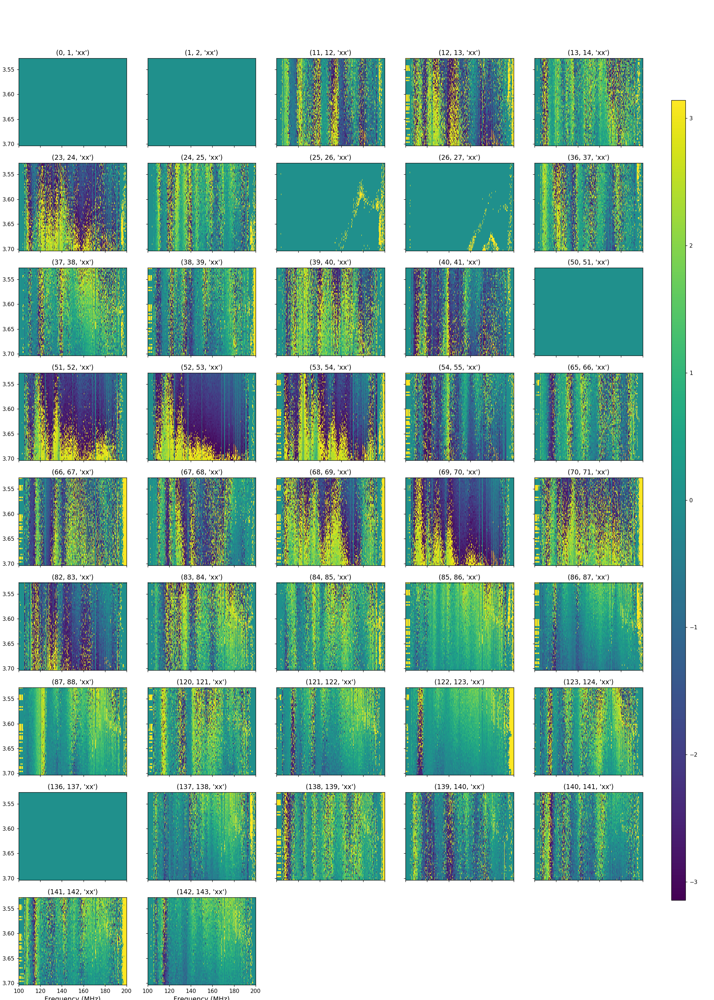

In [23]:
Nside = 5
Yside = int(np.ceil(float(nbls)/Nside))
fig, axes = pylab.subplots(Yside, Nside, figsize=(18, 14*float(Yside)/Nside), dpi=75)
fig.suptitle("", fontsize=14)
fig.tight_layout(rect=(0, 0, 1, 0.95))
k = 0
freqs = np.linspace(100,200,1024)
lst_hrs = lst * 12/np.pi
for i in range(Yside):
    for j in range(Nside):
        ax = axes[i,j]
        if  k < nbls:
            blp =  bl_grp[k]
            ax.set_title(bl)
            pylab.sca(ax)
            im = uvtools.plot.waterfall(uvr.get_data(blp)* ~uvr.get_flags(blp), mode='phs', mx=np.pi,drng=2*np.pi,  extent=(100,200, lst_hrs[-1],lst_hrs[0]),)
            ax.xaxis.set_ticks_position('bottom')
            ax.set_title(blp)
        else:
            ax.axis('off')

        if j != 0:
            ax.set_yticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_yticklabels()]
            ax.set_ylabel('LST (hrs)', fontsize=12)
        if i != Yside-1:
            ax.set_xticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_xticklabels()]
            ax.set_xlabel('Frequency (MHz)', fontsize=12)
        k += 1 
        
fig.subplots_adjust(right=0.90)
cax = fig.add_axes([0.94, 0.10, 0.02, 0.8])
cb = fig.colorbar(im, cax=cax)

<IPython.core.display.Javascript object>


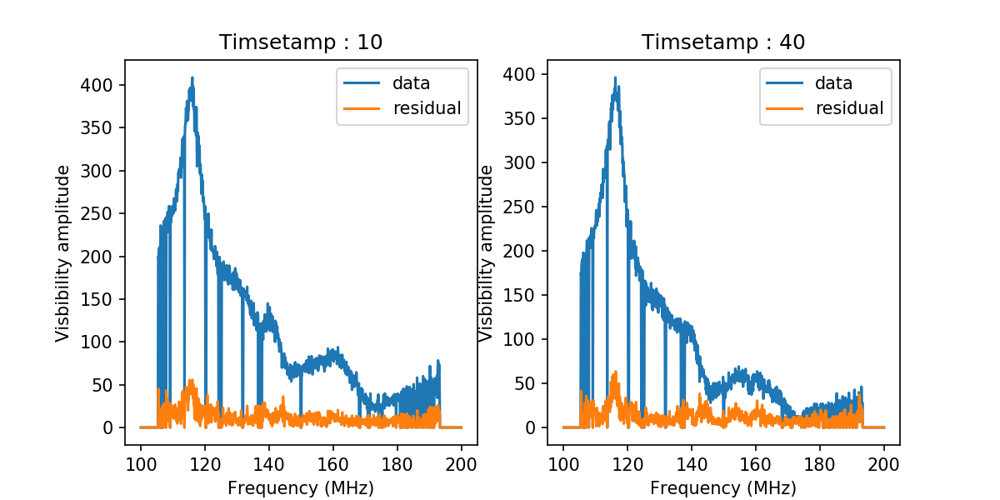

Text(0.5,1,'Timsetamp : 40')

In [24]:
data_11_12 = uvd.get_data(bl) * ~uvd.get_flags(bl)
resdata_11_12 = uvr.get_data(bl) * ~uvr.get_flags(bl)

fig = pylab.figure(figsize=(8,4))
pylab.subplot(121)
pylab.plot(freqs, np.abs(data_11_12[10, :]), label='data')
pylab.plot(freqs, np.abs(resdata_11_12[10, :]), label='residual')
pylab.legend()
pylab.xlabel('Frequency (MHz)',fontsize=10)
pylab.ylabel('Visbibility amplitude', fontsize=10)
pylab.title('Timsetamp : 10', size=12)

pylab.subplot(122)
pylab.plot(freqs, np.abs(data_11_12[40, :]), label='data')
pylab.plot(freqs, np.abs(resdata_11_12[40, :]), label='residual')
pylab.legend()
pylab.xlabel('Frequency (MHz)',fontsize=10)
pylab.ylabel('Visbibility amplitude', fontsize=10)
pylab.title('Timsetamp : 40', size=12)

## Generating images

In [25]:
# convert uvfiles to msfiles
uvc = uc.UVConvert(uvfile)
uvc.convert_uv(clobber=True)

Phasing visibilities to 2458115.32318
Converting /Users/Ridhima/Documents/ucb_projects/beam_characterization/hera_data/zen.2458115.31939.xx.HH.uvOCR to /Users/Ridhima/Documents/ucb_projects/beam_characterization/hera_data/zen.2458115.31939.xx.HH.uvOCR.uvfits
Converting /Users/Ridhima/Documents/ucb_projects/beam_characterization/hera_data/zen.2458115.31939.xx.HH.uvOCR.uvfits to /Users/Ridhima/Documents/ucb_projects/beam_characterization/hera_data/zen.2458115.31939.xx.HH.uvOCR.ms
CMD: casa --nologger --nologfile --nogui -c uvfits2ms.py


In [26]:
uvcr = uc.UVConvert(resfile)
uvcr.convert_uv(clobber=True)

Phasing visibilities to 2458115.32318
Converting /Users/Ridhima/Documents/ucb_projects/beam_characterization/hera_data/zen.2458115.31939.xx.HH.uvOCR.res to /Users/Ridhima/Documents/ucb_projects/beam_characterization/hera_data/zen.2458115.31939.xx.HH.uvOCR.res.uvfits
Converting /Users/Ridhima/Documents/ucb_projects/beam_characterization/hera_data/zen.2458115.31939.xx.HH.uvOCR.res.uvfits to /Users/Ridhima/Documents/ucb_projects/beam_characterization/hera_data/zen.2458115.31939.xx.HH.uvOCR.res.ms
CMD: casa --nologger --nologfile --nogui -c uvfits2ms.py


In [7]:
msfile = uvfile + '.ms'
rmsfile = resfile + '.ms'

In [8]:
img = imag.Imaging(msfile)
imagename = '2458115.31939.xx_a11'
img.generate_image(imagename, antenna='11')

Imaging using antenna(s) 11
CMD: casa --nologger --nologfile --nogui -c clean.py


In [29]:
img.to_fits(imagename, imagename + '.fits')

CMD: casa --nologger --nologfile --nogui -c exportfits.py


<IPython.core.display.Javascript object>


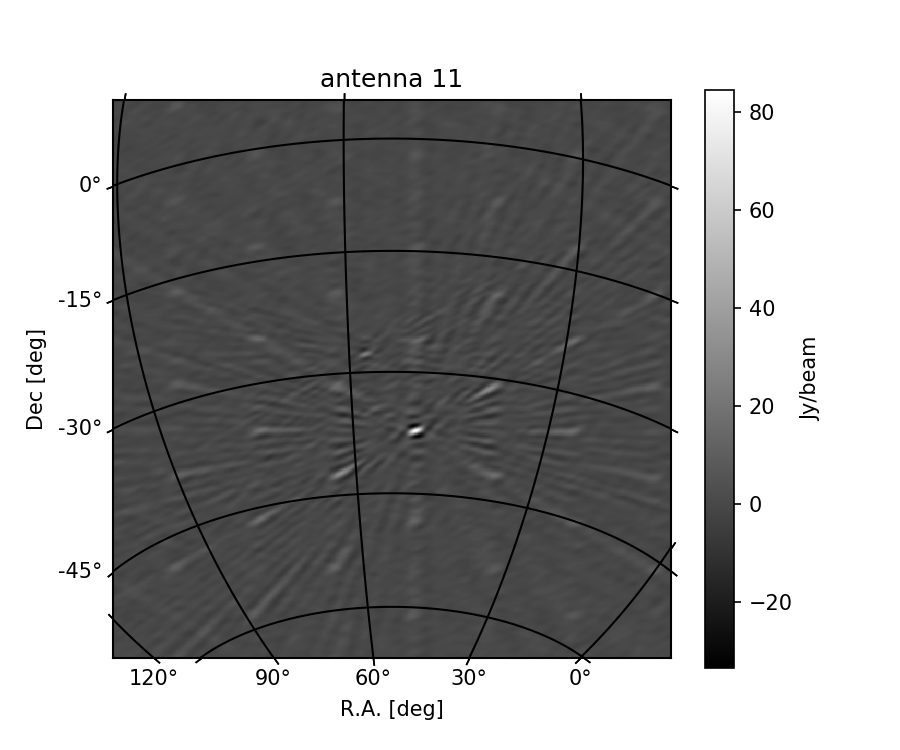

In [30]:
img.plot_image(imagename + '.fits', title='antenna 11')

In [10]:
rimg = imag.Imaging(rmsfile)
rimagename = '2458115.31939.xx.res_a11'
rimg.generate_image(rimagename, antenna=11)

Imaging using antenna(s) 11
CMD: casa --nologger --nologfile --nogui -c clean.py


In [11]:
rimg.to_fits(rimagename, rimagename + '.fits')

CMD: casa --nologger --nologfile --nogui -c exportfits.py


<IPython.core.display.Javascript object>


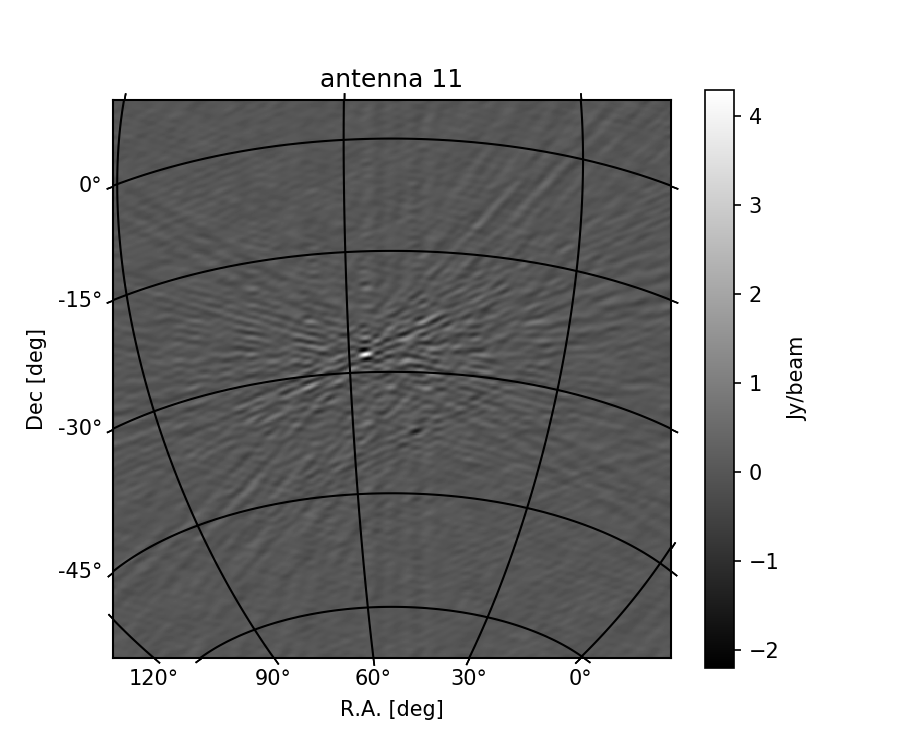

In [33]:
rimg.plot_image(rimagename + '.fits', title='antenna 11')

In [34]:
imagename = '2458115.31939.xx_a23'
img.generate_image(imagename, antenna='23')

Imaging using antenna(s) 23
CMD: casa --nologger --nologfile --nogui -c clean.py


In [35]:
img.to_fits(imagename, imagename + '.fits')

CMD: casa --nologger --nologfile --nogui -c exportfits.py


<IPython.core.display.Javascript object>


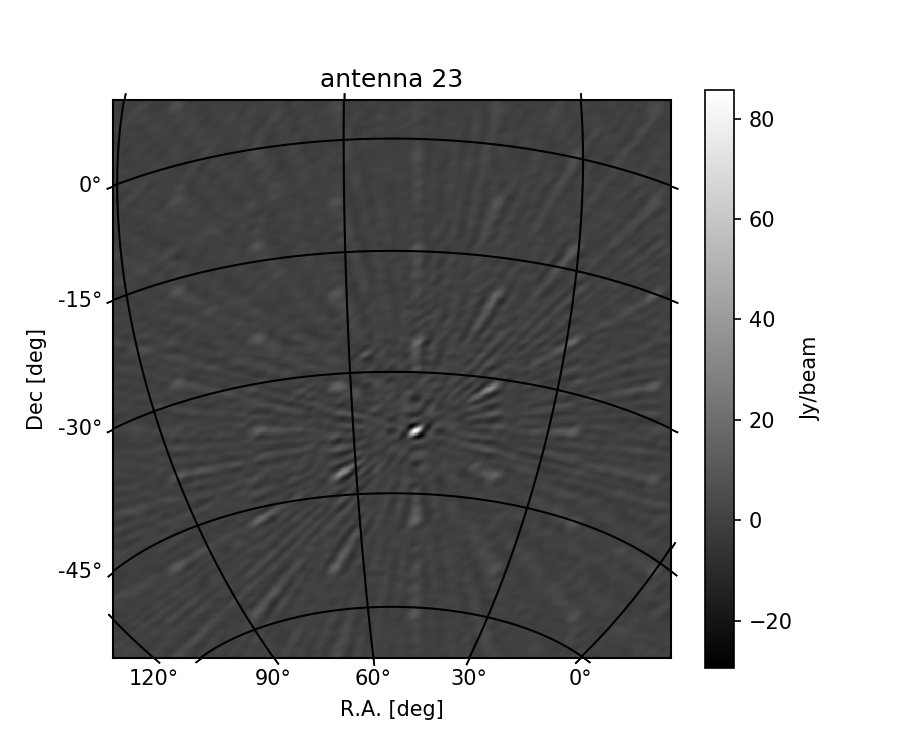

In [36]:
img.plot_image(imagename + '.fits', title='antenna 23')

In [37]:
rimagename = '2458115.31939.xx.res_a23'
rimg.generate_image(rimagename, antenna=23)

Imaging using antenna(s) 23
CMD: casa --nologger --nologfile --nogui -c clean.py


In [38]:
rimg.to_fits(rimagename, rimagename + '.fits')

CMD: casa --nologger --nologfile --nogui -c exportfits.py


<IPython.core.display.Javascript object>


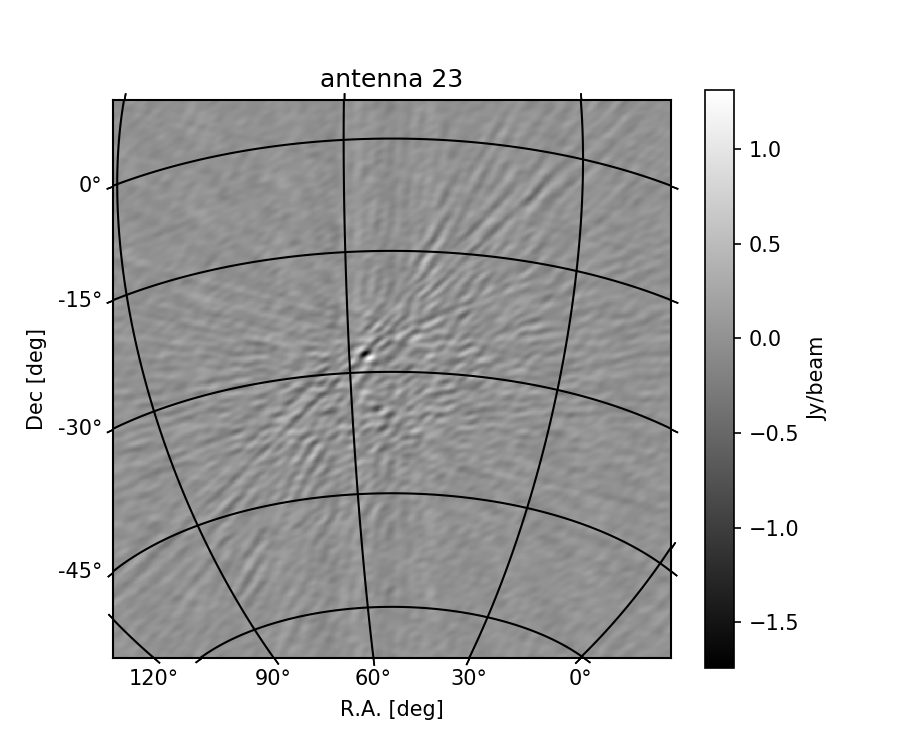

In [39]:
rimg.plot_image(rimagename + '.fits', title='antenna 23')

In [42]:
img.remove_image(imagename)
rimg.remove_image(rimagename)

In [40]:
img.delete_trash()